# Estimating Forest Cover Density and Land Area Coverage in Nigeria

I utilized the [FAO GAUL: Global Administrative Unit Layers 2015, First-Level Administrative Units](https://developers.google.com/earth-engine/datasets/catalog/FAO_GAUL_2015_level1) from FAO UN for extracting the study area (roi) and the [Global 4-class PALSAR-2/PALSAR Forest/Non-Forest Map](https://developers.google.com/earth-engine/datasets/catalog/JAXA_ALOS_PALSAR_YEARLY_FNF4#bands) from JAXA EORC for the Forest Cover Analysis.

In [79]:
import ee
import geemap

## Evaluating Nigeria Forest Cover Dynamics

In [80]:
# extracting region of interest (Nigeria) from the FAO Administrative Units Data

m = geemap.Map(center=[9,7], zoom=6, height='500px')
nija = ee.FeatureCollection("FAO/GAUL/2015/level1").filter(ee.Filter.eq('ADM0_NAME', 'Nigeria'))
ng = ee.FeatureCollection("FAO/GAUL/2015/level0").filter(ee.Filter.eq('ADM0_NAME', 'Nigeria'))
m.addLayer(ng, {}, 'Nigeria Boundary')
m

Map(center=[9, 7], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

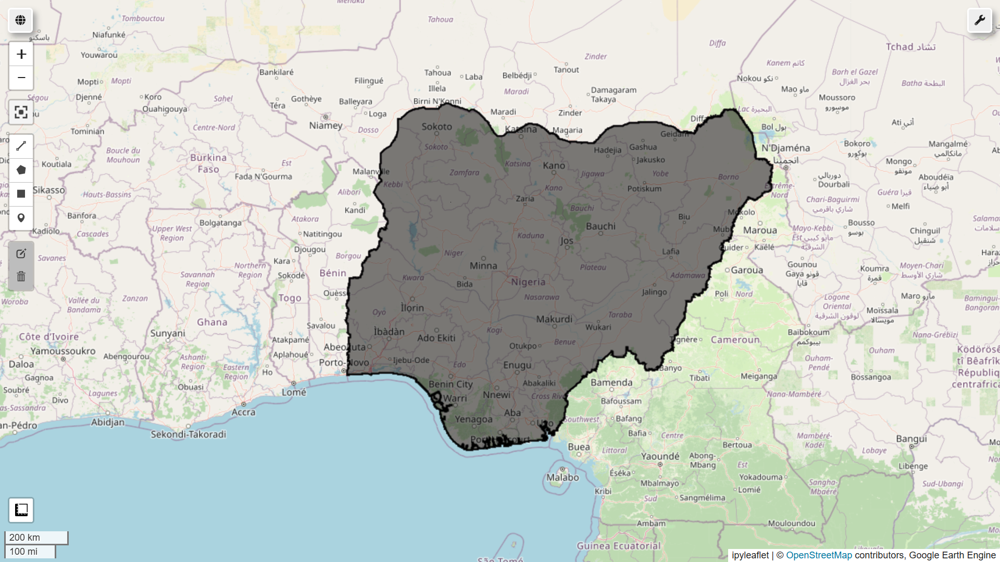

In [81]:
from IPython.display import Image, display
display(Image(filename='img/nig_boundary.png', embed=True))

In [82]:
dataset = ee.ImageCollection('JAXA/ALOS/PALSAR/YEARLY/FNF4').filterDate('2020-01-01', '2020-12-31').select('fnf')

In [83]:
m = geemap.Map()

legend_dict = {
    '1 Dense Forest': '#00b200',
    '2 Non-dense Forest': '#83ef62',
    '3 Non-Forest': '#ffff99',
    '4 Water': '#0000ff',
}

fnfVis = {
  'min': 1,
  'max': 4,
  'palette': ['00b200','83ef62','ffff99','0000ff'],
}

vis_params = {
    'color': '#000000',
    'width': 1,
    'lineType': 'solid',
    'fillColor': '00000000',
}

fnf = dataset.map(lambda img: img.clipToCollection(nija))
m.centerObject(nija, zoom=6)
m.addLayer(fnf, fnfVis, 'Forest/Non-Forest')
m.addLayer(ng.style(**vis_params), {}, 'Nigeria')
text = 'Map Created by Emeka Orji'
text2 = 'Data Source: JAXA EORC and FAO UN'
m.add_text(text2, position='bottomleft', fontsize=10)
m.add_text(text)
m.add_legend(title='Forest/Non-Forest Classification', legend_dict=legend_dict, layer_name='Forest/Non-Forest')
m

Map(center=[9.589444610453397, 8.089338153274129], controls=(WidgetControl(options=['position', 'transparent_b…

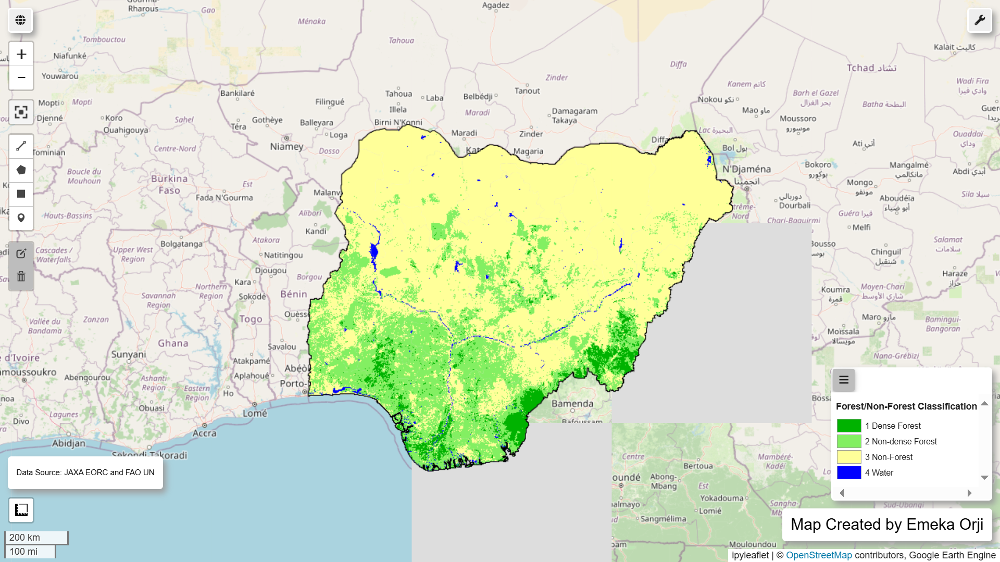

In [84]:
display(Image(filename='img/ng_forest_cover.png', embed=True))

In [85]:
projection = fnf.geometry().projection().getInfo()
projection

{'type': 'Projection', 'crs': 'EPSG:4326', 'transform': [1, 0, 0, 0, 1, 0]}

In [86]:
crs = projection['crs']
crs

'EPSG:4326'

In [87]:
fc = geemap.zonal_stats_by_group(fnf, ng, out_file_path=None, stat_type='SUM', decimal_places=2, scale=25, crs=crs, denominator=1e6, return_fc=True)

Computing ... 


In [88]:
ng_fnf = geemap.ee_to_df(fc)

In [89]:
ng_fnf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ADM0_CODE   1 non-null      int64  
 1   ADM0_NAME   1 non-null      object 
 2   Class_1     1 non-null      float64
 3   Class_2     1 non-null      float64
 4   Class_3     1 non-null      float64
 5   Class_4     1 non-null      float64
 6   Class_sum   1 non-null      float64
 7   DISP_AREA   1 non-null      object 
 8   EXP0_YEAR   1 non-null      int64  
 9   STATUS      1 non-null      object 
 10  STR0_YEAR   1 non-null      int64  
 11  Shape_Area  1 non-null      float64
 12  Shape_Leng  1 non-null      float64
dtypes: float64(7), int64(3), object(3)
memory usage: 236.0+ bytes


In [90]:
ng_fnf.head()

,ADM0_CODE,ADM0_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP0_YEAR,STATUS,STR0_YEAR,Shape_Area,Shape_Leng
0,182,Nigeria,52473.65,232308.93,612542.56,11652.47,908977.61,NO,3000,Member State,1000,74.92459,68.220375


In [91]:
nigfnf = ng_fnf.drop(['ADM0_CODE', 'ADM0_NAME', 'Class_sum', 'DISP_AREA', 'EXP0_YEAR', 'STATUS', 'STR0_YEAR', 'Shape_Area', 'Shape_Leng'], axis= 1)

In [92]:
nig_fnf = nigfnf.rename(columns={'Class_1':'Dense Forest', 'Class_2':'Non-dense Forest', 'Class_3':'Non-Forest', 'Class_4':'Water Body'})
nig_fnf = nig_fnf.transpose()
nig_fnf['Ngr Forest Type'] = nig_fnf.index
nig_fnf = nig_fnf.rename(columns={0:'area_cover'})
#nig_fnf['area_cover'] *=100
nig_fnf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, Dense Forest to Water Body
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   area_cover       4 non-null      float64
 1   Ngr Forest Type  4 non-null      object 
dtypes: float64(1), object(1)
memory usage: 96.0+ bytes


In [93]:
nig_fnf.head()

,area_cover,Ngr Forest Type
Dense Forest,52473.65,Dense Forest
Non-dense Forest,232308.93,Non-dense Forest
Non-Forest,612542.56,Non-Forest
Water Body,11652.47,Water Body


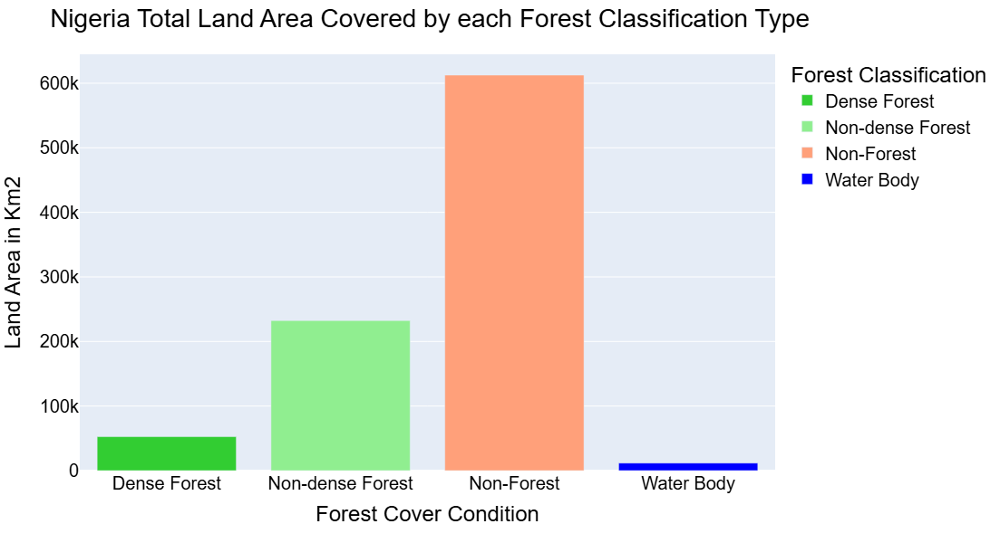

In [94]:
import plotly.express as px


fig = px.bar(nig_fnf, x='Ngr Forest Type', y='area_cover', color='Ngr Forest Type',
             color_discrete_map={'Dense Forest':'limegreen', 'Non-dense Forest':'lightgreen', 'Non-Forest':'lightsalmon', 'Water Body':'blue'},
             category_orders={'Ngr Forest Type':['Dense Forest', 'Non-dense Forest', 'Non-Forest', 'Water Body']})

fig.update_layout(
    height = 600,
    title="Nigeria Total Land Area Covered by each Forest Classification Type",
    xaxis_title="Forest Cover Condition",
    yaxis_title="Land Area in Km2",
    legend_title="Forest Classification",
    font=dict(
        family="Arial",
        size=20,
        color="Black"
    )
)

fig.show()

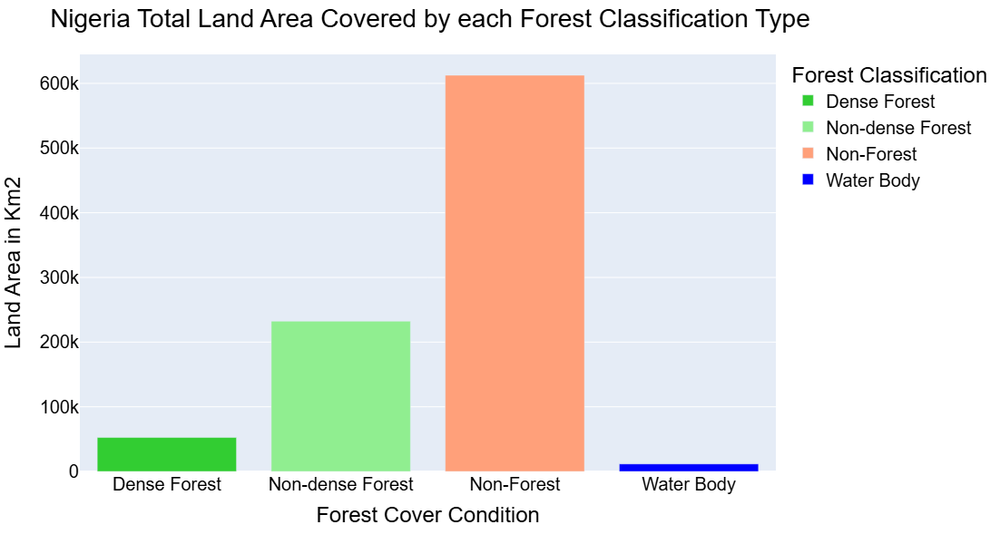

In [95]:
display(Image(filename='img/ng_fnf_bar3.png', embed=True))

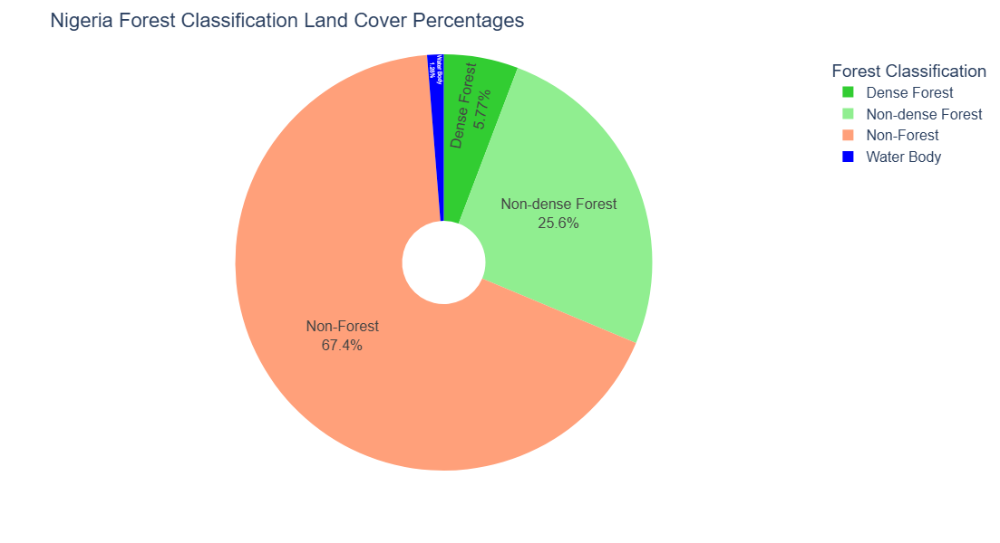

In [96]:
fig = px.pie(nig_fnf, values='area_cover', names='Ngr Forest Type',hole=0.2, color='Ngr Forest Type',
             color_discrete_map={'Dense Forest':'limegreen', 'Non-dense Forest':'lightgreen', 'Non-Forest':'lightsalmon', 'Water Body':'blue'},
             category_orders={'Ngr Forest Type':['Dense Forest', 'Non-dense Forest', 'Non-Forest', 'Water Body']})

fig.update_layout(
    height = 600,
    width = 600,
    title="Nigeria Forest Classification Land Cover Percentages",
    legend_title="Forest Classification",
    font=dict(
        family="Arial",
        size=16
    )
)

fig.update_traces(textposition='inside', textinfo='percent+label')


fig.show()

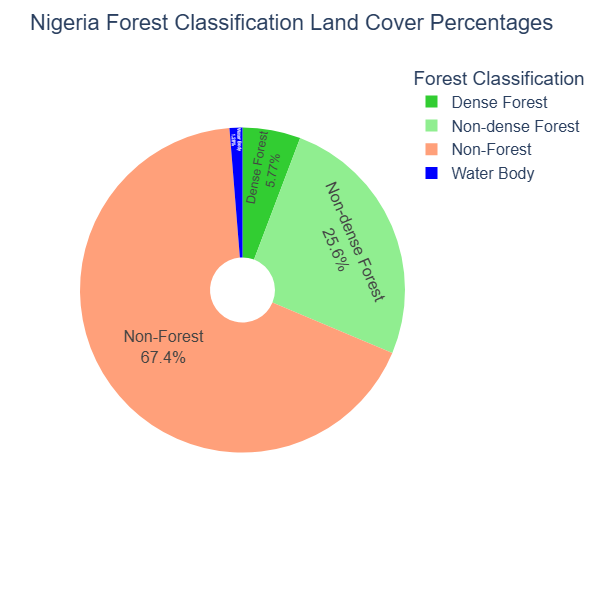

In [97]:
display(Image(filename='img/ng_fnf_pie1.png', embed=True))

## Forest Cover Classification by States

In [98]:
m = geemap.Map()

legend_dict = {
    '1 Dense Forest': '#00b200',
    '2 Non-dense Forest': '#83ef62',
    '3 Non-Forest': '#ffff99',
    '4 Water': '#0000ff',
}

fnfVis = {
  'min': 1,
  'max': 4,
  'palette': ['00b200','83ef62','ffff99','0000ff'],
}

vis_params = {
    'color': '#000000',
    'width': 1,
    'lineType': 'solid',
    'fillColor': '00000000',
}


m.add_labels(
    data=nija,
    column="ADM1_NAME",
    font_size="7pt",
    font_color="black",
    font_family="arial",
    font_weight="bold",
    draggable=True,
)


fnf = dataset.map(lambda img: img.clipToCollection(nija))
m.centerObject(ng, zoom=6)
m.addLayer(fnf, fnfVis, 'Forest/Non-Forest')
m.addLayer(nija.style(**vis_params), {}, 'Nigeria')
text = 'Map Created by Emeka Orji'
text2 = 'Data Source: JAXA EORC and FAO UN'
m.add_text(text2, position='bottomleft', fontsize=10)
m.add_text(text)
m.add_legend(title='Forest/Non-Forest Classification', legend_dict=legend_dict, layer_name='Forest/Non-Forest')
m

Map(center=[9.589444610453368, 8.089338153274143], controls=(WidgetControl(options=['position', 'transparent_b…

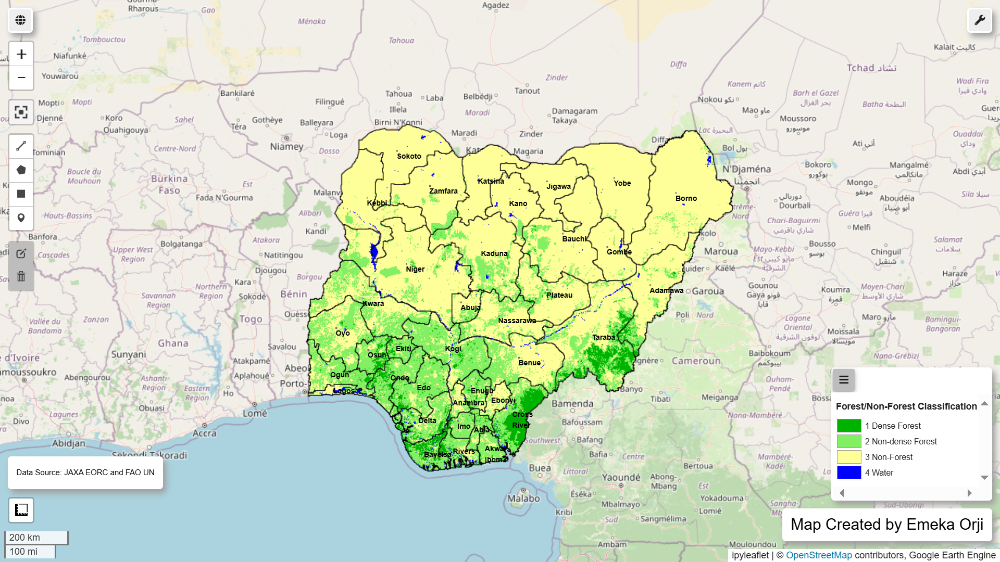

In [99]:
display(Image(filename='img/nig_forest_cover.png', embed=True))

In [100]:
fc = geemap.zonal_stats_by_group(fnf, nija, out_file_path=None, stat_type='SUM', decimal_places=2, scale=25, crs=crs, denominator=1e6, return_fc=True)

Computing ... 


In [101]:
# Converting the google earth engine feature to dataframe and assessing the percentage of forest cover regions to the total state land area (Class_sum)

nija_fnf = geemap.ee_to_df(fc)
nija_fnf.head()

,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng
0,182,Nigeria,65698,Abia,707.61,2874.36,1133.29,8.74,4724.00,NO,3000,Member State,1997,0.385485,4.198984
1,182,Nigeria,65699,Bauchi,516.14,6131.88,42065.64,346.72,49060.38,NO,3000,Member State,1997,4.055679,12.903322
2,182,Nigeria,65700,Bayelsa,3600.15,4717.52,1125.74,548.07,9991.48,NO,3000,Member State,1997,0.814464,8.485513
3,182,Nigeria,65701,Ebonyi,150.91,1888.74,4119.94,29.23,6188.82,NO,3000,Member State,1997,0.505731,4.031511
4,182,Nigeria,65702,Ekiti,981.04,3495.14,754.26,6.17,5236.61,NO,3000,Member State,1997,0.429200,3.198663


### Assessing the proportion of Dense Forest cover area to the total land area of Individual Nigerian States


### States With highest proportion of dense forest cover

In [102]:
nija_fnf['class1_percent'] = ((nija_fnf['Class_1'] / nija_fnf['Class_sum']) * 100).round(2)
#nija_fnf.sort_values('class1_percent', ascending=False).head()

In [103]:
# Checking for the count of states with dense forests covering less than 1% of the state's total landmass.
nija_fnf[nija_fnf['class1_percent'] < 1].shape[0]

10

In [104]:
# Assessing the Top 10 states with the highest percentage of dense forest land cover area

ngg = nija_fnf.nlargest(n=10, columns=['class1_percent']).sort_values(by='class1_percent', ascending=False)
ngg.head(10)

,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng,class1_percent
19,182,Nigeria,2217,Cross River,10114.31,8294.63,2289.84,311.29,21010.07,NO,3000,Member State,1000,1.715713,10.919583,48.14
2,182,Nigeria,65700,Bayelsa,3600.15,4717.52,1125.74,548.07,9991.48,NO,3000,Member State,1997,0.814464,8.485513,36.03
33,182,Nigeria,2234,Osun,2076.72,5623.12,1438.86,51.20,9189.90,NO,3000,Member State,1000,0.752934,4.380049,22.60
8,182,Nigeria,65706,Ondo,2999.41,9559.34,1806.10,104.55,14469.40,NO,3000,Member State,1997,1.183914,8.104566,20.73
10,182,Nigeria,65708,Rivers,1735.57,4263.62,2272.45,455.21,8726.85,NO,3000,Member State,1997,0.711474,10.311515,19.89
4,182,Nigeria,65702,Ekiti,981.04,3495.14,754.26,6.17,5236.61,NO,3000,Member State,1997,0.429200,3.198663,18.73
20,182,Nigeria,2218,Delta,2919.78,8657.34,4671.67,525.60,16774.39,NO,3000,Member State,1000,1.369407,11.554842,17.41
35,182,Nigeria,2239,Taraba,10384.79,19630.49,29547.09,868.19,60430.56,NO,3000,Member State,1000,4.957189,13.739033,17.18
0,182,Nigeria,65698,Abia,707.61,2874.36,1133.29,8.74,4724.00,NO,3000,Member State,1997,0.385485,4.198984,14.98
21,182,Nigeria,2219,Edo,2684.21,12945.88,3866.09,93.10,19589.28,NO,3000,Member State,1000,1.601900,7.455604,13.70


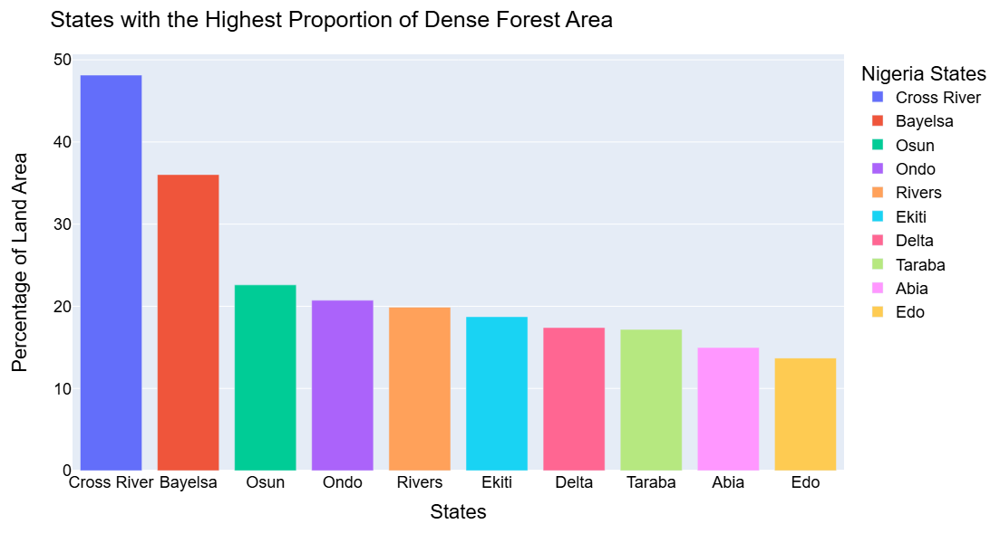

In [105]:
fig = px.bar(ngg, x='ADM1_NAME', y='class1_percent', color='ADM1_NAME', height=600)

fig.update_layout(
    title="States with the Highest Proportion of Dense Forest Area",
    xaxis_title="States",
    yaxis_title="Percentage of Land Area",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

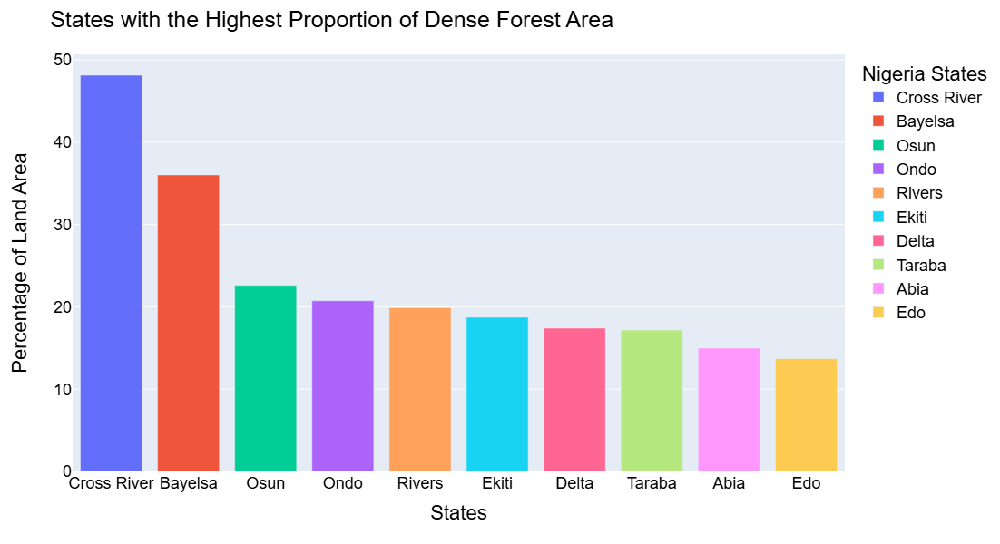

In [106]:
display(Image(filename='img/nig_land_bar1.png', embed=True))

### States with Lowest proportion of dense forest cover

In [107]:
# Assessing the Bottom 10 states with the least percentage of dense forest land cover area

ngg = nija_fnf.nsmallest(n=10, columns=['class1_percent']).sort_values(by='class1_percent', ascending=False)
ngg.head(10)

,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng,class1_percent
31,182,Nigeria,2231,Niger,700.74,12058.42,56489.19,1769.86,71018.21,NO,3000,Member State,1000,5.855474,16.976752,0.99
6,182,Nigeria,65704,Gombe,82.05,937.97,16840.61,329.79,18190.42,NO,3000,Member State,1997,1.501908,5.521496,0.45
12,182,Nigeria,65710,Zamfara,96.26,3251.26,31041.26,135.80,34524.58,NO,3000,Member State,1997,2.866844,8.400908,0.28
25,182,Nigeria,2225,Kano,54.11,1108.29,18556.46,364.24,20083.10,NO,3000,Member State,1000,1.665530,7.285684,0.27
27,182,Nigeria,2227,Kebbi,49.46,1745.60,33135.98,901.93,35832.97,NO,3000,Member State,1000,2.972119,12.825316,0.14
18,182,Nigeria,2216,Borno,44.09,4030.74,66736.85,784.58,71596.26,NO,3000,Member State,1000,5.941520,13.717056,0.06
23,182,Nigeria,2223,Jigawa,2.02,283.48,23642.13,73.43,24001.06,NO,3000,Member State,1000,1.993923,10.396614,0.01
26,182,Nigeria,2226,Katsina,2.40,394.39,23180.57,127.69,23705.05,NO,3000,Member State,1000,1.970499,8.758852,0.01
36,182,Nigeria,2240,Yobe,5.48,612.71,44832.83,121.77,45572.79,NO,3000,Member State,1000,3.787278,10.339501,0.01
11,182,Nigeria,65709,Sokoto,1.30,278.62,31430.64,207.15,31917.71,NO,3000,Member State,1997,2.659952,9.654814,0.00


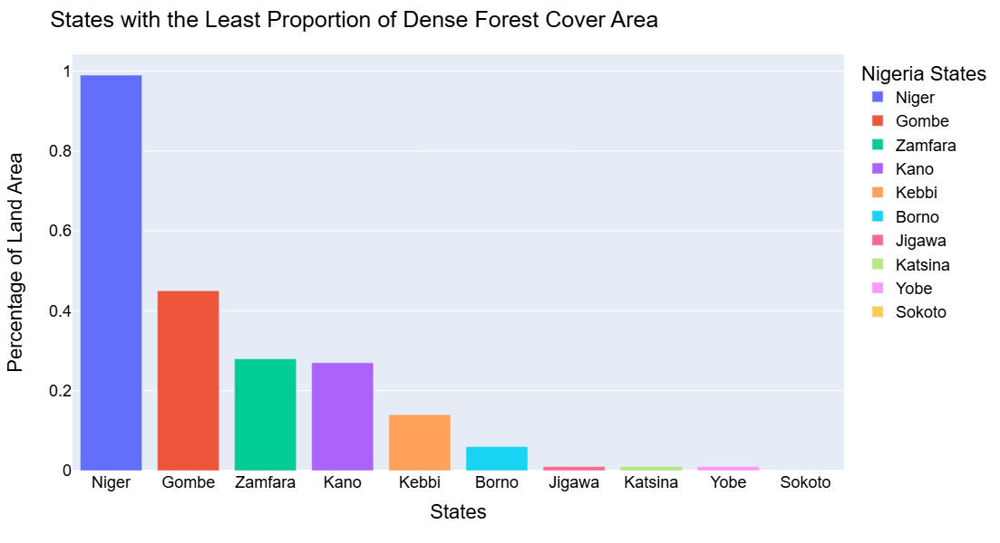

In [108]:
fig = px.bar(ngg, x='ADM1_NAME', y='class1_percent', color='ADM1_NAME', height=600)

fig.update_layout(
    title="States with the Least Proportion of Dense Forest Cover Area",
    xaxis_title="States",
    yaxis_title="Percentage of Land Area",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

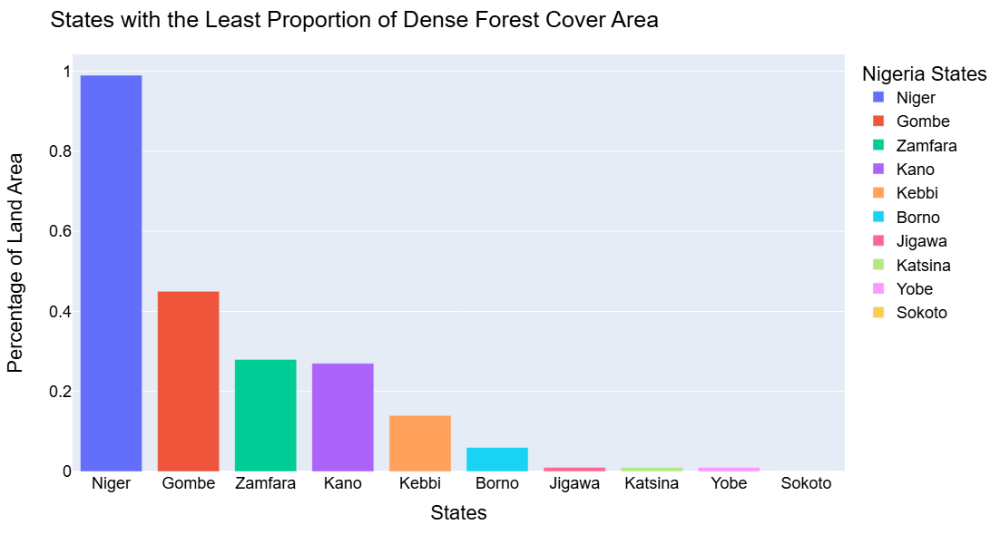

In [109]:
display(Image(filename='img/nig_land_bar3.png', embed=True))

## Visualizing amout of State's land area in square kilometers having dense forest cover

In [110]:
# Assessing the Top 10 states with the highest dense forest land cover area

ngg = nija_fnf.nlargest(n=10, columns=['Class_1']).sort_values(by='Class_1', ascending=False)
ngg.head(10)

,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng,class1_percent
35,182,Nigeria,2239,Taraba,10384.79,19630.49,29547.09,868.19,60430.56,NO,3000,Member State,1000,4.957189,13.739033,17.18
19,182,Nigeria,2217,Cross River,10114.31,8294.63,2289.84,311.29,21010.07,NO,3000,Member State,1000,1.715713,10.919583,48.14
2,182,Nigeria,65700,Bayelsa,3600.15,4717.52,1125.74,548.07,9991.48,NO,3000,Member State,1997,0.814464,8.485513,36.03
8,182,Nigeria,65706,Ondo,2999.41,9559.34,1806.10,104.55,14469.40,NO,3000,Member State,1997,1.183914,8.104566,20.73
20,182,Nigeria,2218,Delta,2919.78,8657.34,4671.67,525.60,16774.39,NO,3000,Member State,1000,1.369407,11.554842,17.41
21,182,Nigeria,2219,Edo,2684.21,12945.88,3866.09,93.10,19589.28,NO,3000,Member State,1000,1.601900,7.455604,13.70
28,182,Nigeria,2228,Kogi,2427.00,18413.38,7716.09,385.26,28941.73,NO,3000,Member State,1000,2.372238,9.657707,8.39
33,182,Nigeria,2234,Osun,2076.72,5623.12,1438.86,51.20,9189.90,NO,3000,Member State,1000,0.752934,4.380049,22.60
14,182,Nigeria,2211,Adamawa,2031.85,6104.03,25871.15,384.83,34391.86,NO,3000,Member State,1000,2.830909,11.814723,5.91
10,182,Nigeria,65708,Rivers,1735.57,4263.62,2272.45,455.21,8726.85,NO,3000,Member State,1997,0.711474,10.311515,19.89


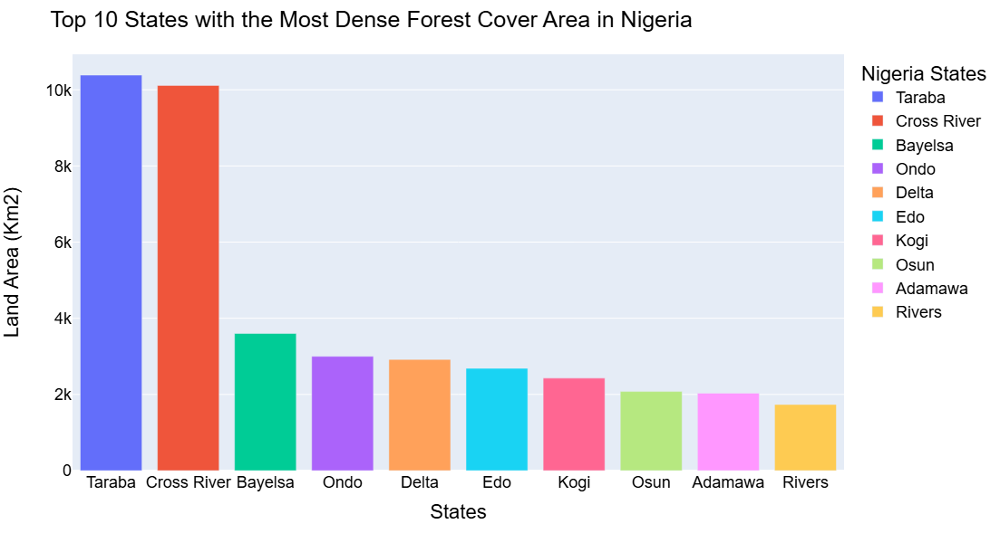

In [111]:
fig = px.bar(ngg, x='ADM1_NAME', y='Class_1', color='ADM1_NAME', height=600)

fig.update_layout(
    title="Top 10 States with the Most Dense Forest Cover Area in Nigeria",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

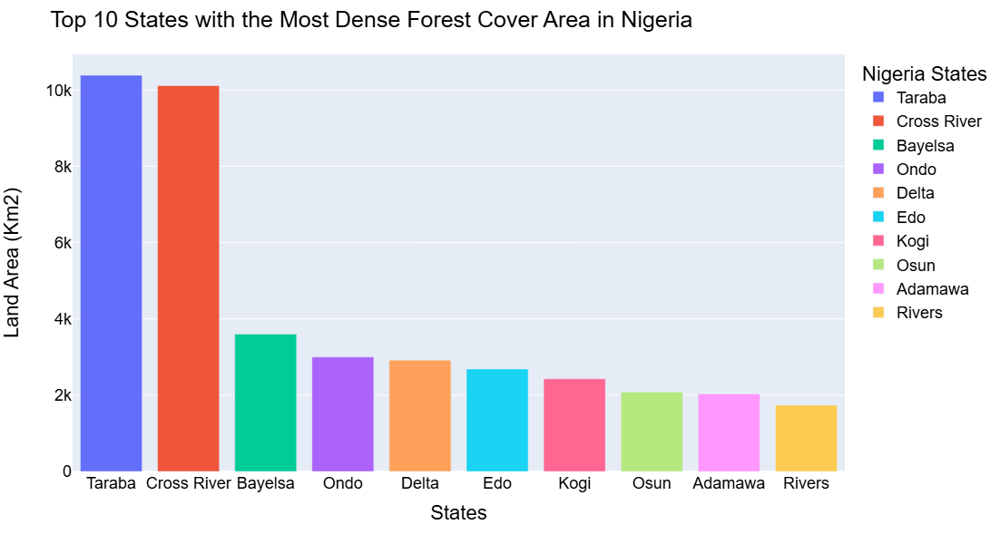

In [112]:
display(Image(filename='img/nig_land_bar2.png', embed=True))

In [113]:
# Assessing the bottom 10 states with the least dense forest land cover

ngg = nija_fnf.nsmallest(n=10, columns=['Class_1']).sort_values(by='Class_1', ascending=False)
ngg.head(10)

,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng,class1_percent
30,182,Nigeria,2230,Lagos,120.36,922.66,1944.67,796.94,3784.63,NO,3000,Member State,1000,0.309420,4.229773,3.18
12,182,Nigeria,65710,Zamfara,96.26,3251.26,31041.26,135.80,34524.58,NO,3000,Member State,1997,2.866844,8.400908,0.28
6,182,Nigeria,65704,Gombe,82.05,937.97,16840.61,329.79,18190.42,NO,3000,Member State,1997,1.501908,5.521496,0.45
25,182,Nigeria,2225,Kano,54.11,1108.29,18556.46,364.24,20083.10,NO,3000,Member State,1000,1.665530,7.285684,0.27
27,182,Nigeria,2227,Kebbi,49.46,1745.60,33135.98,901.93,35832.97,NO,3000,Member State,1000,2.972119,12.825316,0.14
18,182,Nigeria,2216,Borno,44.09,4030.74,66736.85,784.58,71596.26,NO,3000,Member State,1000,5.941520,13.717056,0.06
36,182,Nigeria,2240,Yobe,5.48,612.71,44832.83,121.77,45572.79,NO,3000,Member State,1000,3.787278,10.339501,0.01
26,182,Nigeria,2226,Katsina,2.40,394.39,23180.57,127.69,23705.05,NO,3000,Member State,1000,1.970499,8.758852,0.01
23,182,Nigeria,2223,Jigawa,2.02,283.48,23642.13,73.43,24001.06,NO,3000,Member State,1000,1.993923,10.396614,0.01
11,182,Nigeria,65709,Sokoto,1.30,278.62,31430.64,207.15,31917.71,NO,3000,Member State,1997,2.659952,9.654814,0.00


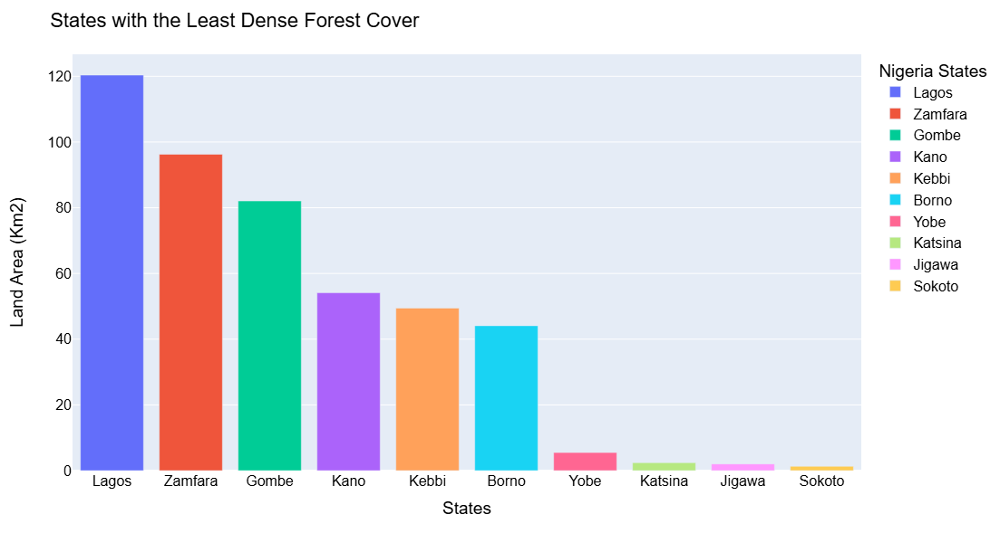

In [114]:
fig = px.bar(ngg, x='ADM1_NAME', y='Class_1', color='ADM1_NAME', height=600)

fig.update_layout(
    title="States with the Least Dense Forest Cover",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=16,
        color="Black"
    )
)

fig.show()

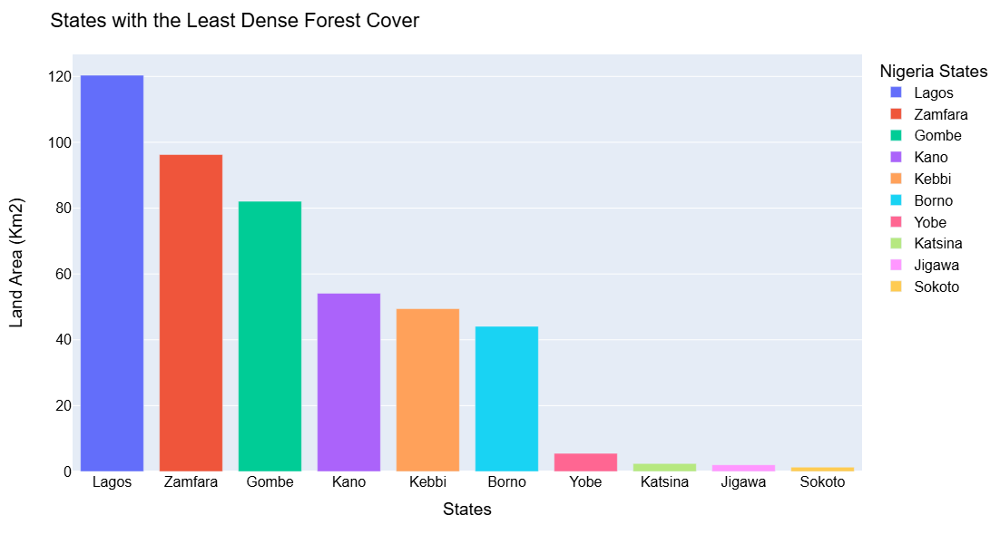

In [115]:
display(Image(filename='img/nig_least_bar.png', embed=True))

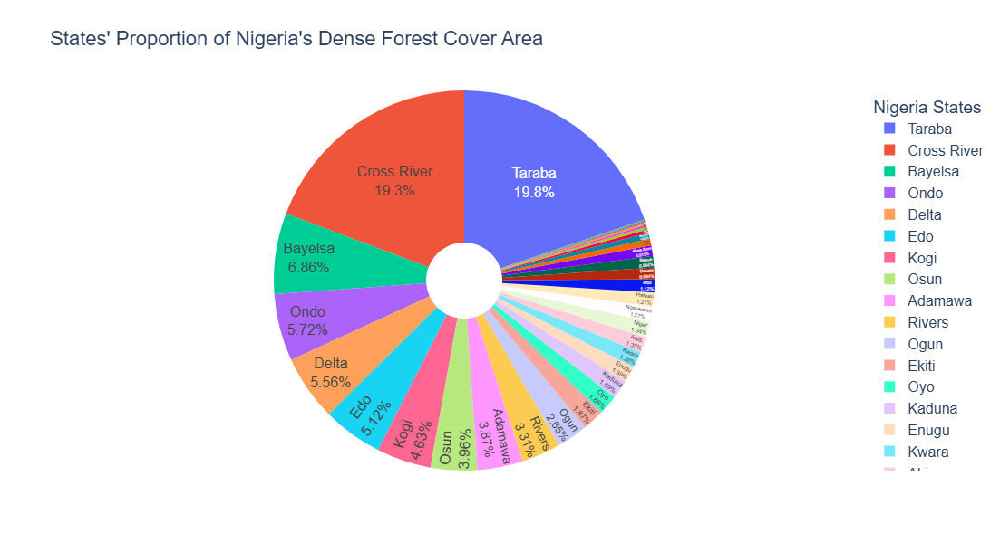

In [116]:
fig = px.pie(nija_fnf, values='Class_1', names='ADM1_NAME', hole=0.2, width=600, height=600,
             title="States' Proportion of Nigeria's Dense Forest Cover Area")

fig.update_traces(textposition='inside', textinfo='percent+label')

fig.update_layout(
    legend_title = 'Nigeria States',
    # width=600,
    # height=600,
        font=dict(
        family="Arial",
        size=16
    )
)

fig.show()

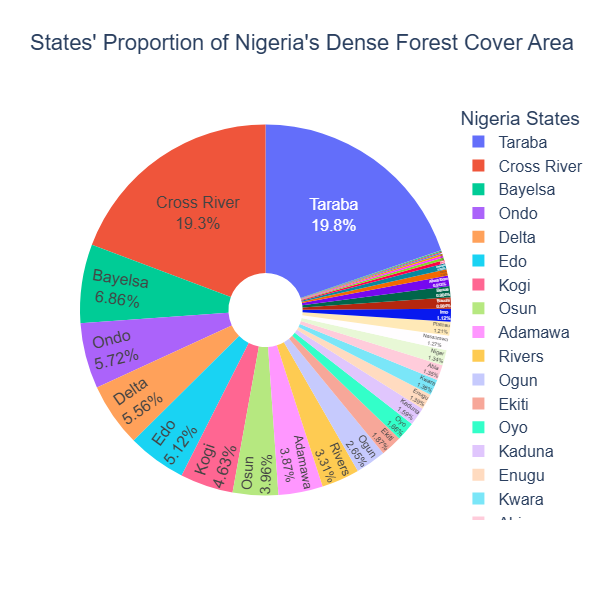

In [117]:
display(Image(filename='img/nig_state_pie.png', embed=True))

## Assessing Variations in Dense Forest Land Cover in Nigeria's South-East and South-South States


In [118]:
m = geemap.Map(center=[9,7], zoom=6, height='500px')
ss_se_states = nija.filter(
    ee.Filter.inList('ADM1_NAME', ['Edo', 'Akwa Ibom', 'Cross River', 'Rivers', 'Bayelsa', 'Delta', 'Imo', 'Abia', 'Anambra', 'Ebonyi', 'Enugu'])
)
imo = ss_se_states.filter(ee.Filter.eq('ADM1_NAME', 'Imo'))
m.centerObject(imo, zoom=8)
m.addLayer(ss_se_states, {}, 'SS / SE States Boundary')
m

Map(center=[5.550234088402793, 7.0468337804945], controls=(WidgetControl(options=['position', 'transparent_bg'…

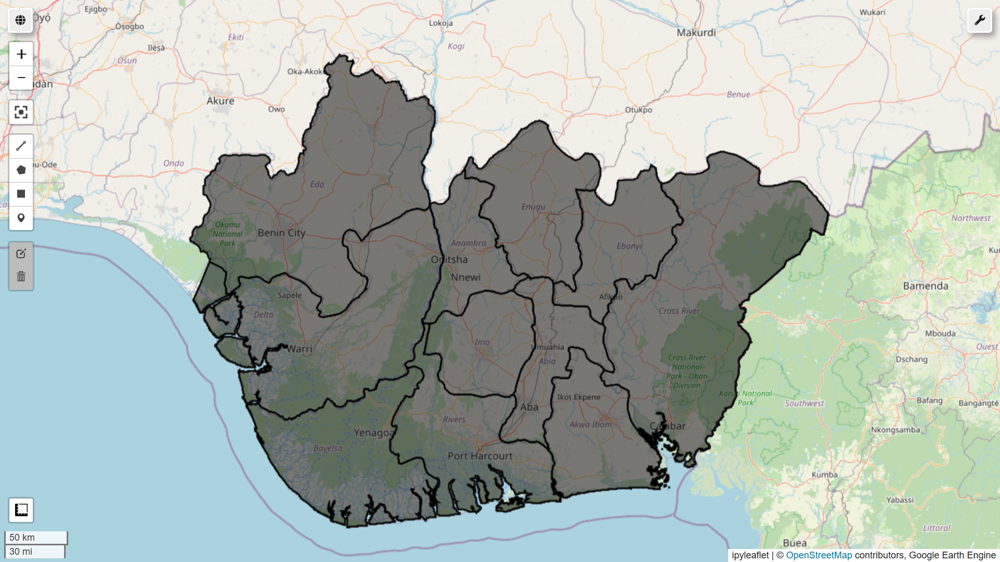

In [119]:
display(Image(filename='img/se_ss.png', embed=True))

In [120]:
m = geemap.Map()

legend_dict = {
    '1 Dense Forest': '#00b200',
    '2 Non-dense Forest': '#83ef62',
    '3 Non-Forest': '#ffff99',
    '4 Water': '#0000ff',
}

fnfVis = {
  'min': 1,
  'max': 4,
  'palette': ['00b200','83ef62','ffff99','0000ff'],
}

vis_params = {
    'color': '#000000',
    'width': 2,
    'lineType': 'solid',
    'fillColor': '00000000',
}

se_fnf = dataset.map(lambda img: img.clipToCollection(ss_se_states))
m.centerObject(imo, zoom=8)
m.addLayer(se_fnf, fnfVis, 'Forest/Non-Forest')
m.addLayer(ss_se_states.style(**vis_params), {}, 'SS States')
text = 'Map Created by Emeka Orji'
m.add_text(text)
text2 = 'Data Source: JAXA EORC and FAO UN'
m.add_text(text2, position='bottomleft', fontsize=10)
m.add_legend(title='Forest/Non-Forest Classification', legend_dict=legend_dict)
m

Map(center=[5.550234088402793, 7.0468337804945], controls=(WidgetControl(options=['position', 'transparent_bg'…

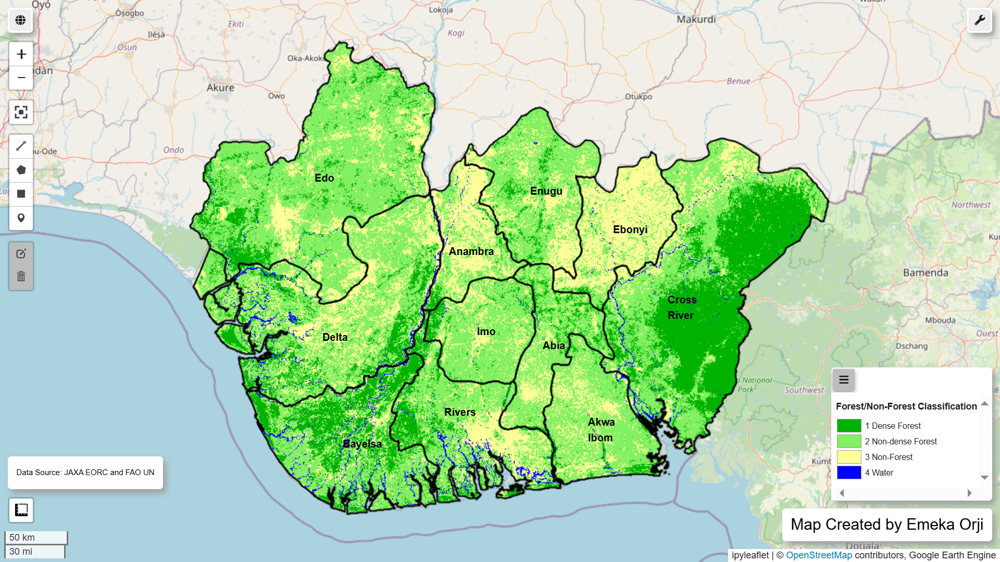

In [121]:
display(Image(filename='img/se_forest.png', embed=True))

In [122]:
m.add_labels(
    data=ss_se_states,
    column="ADM1_NAME",
    font_size="10pt",
    font_color="black",
    font_family="arial",
    font_weight="bold",
    draggable=True,
)

#### Evaluating South East and South South Forest Dynamics

In [123]:
sefnf = se_fnf.first()
sefnf

In [124]:
project = sefnf.projection()
project

In [125]:
crs = project.crs()

In [126]:
fc = geemap.zonal_stats_by_group(fnf, ss_se_states, out_file=None, stat_type='SUM', decimal_places=2, scale = 25, crs=crs, denominator=1e6, return_fc=True)

Computing ... 


In [127]:
ss_se_fnf = geemap.ee_to_df(fc)
ss_se_fnf = ss_se_fnf.sort_values('Class_1', ascending=False)

In [128]:
print(ss_se_fnf.shape)
ss_se_fnf.head()

(11, 15)


,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng
7,182,Nigeria,2217,Cross River,10114.31,8294.63,2289.84,311.29,21010.07,NO,3000,Member State,1000,1.715713,10.919583
1,182,Nigeria,65700,Bayelsa,3600.15,4717.52,1125.74,548.07,9991.48,NO,3000,Member State,1997,0.814464,8.485513
8,182,Nigeria,2218,Delta,2919.78,8657.34,4671.67,525.60,16774.39,NO,3000,Member State,1000,1.369407,11.554842
9,182,Nigeria,2219,Edo,2684.21,12945.88,3866.09,93.10,19589.28,NO,3000,Member State,1000,1.601900,7.455604
4,182,Nigeria,65708,Rivers,1735.57,4263.62,2272.45,455.21,8726.85,NO,3000,Member State,1997,0.711474,10.311515


In [129]:
ss_se_fnf = ss_se_fnf.rename(columns={'Class_1':'Dense Forest', 'Class_2':'Non-dense Forest', 'Class_3':'Non-Forest', 'Class_4':'Water Body'})

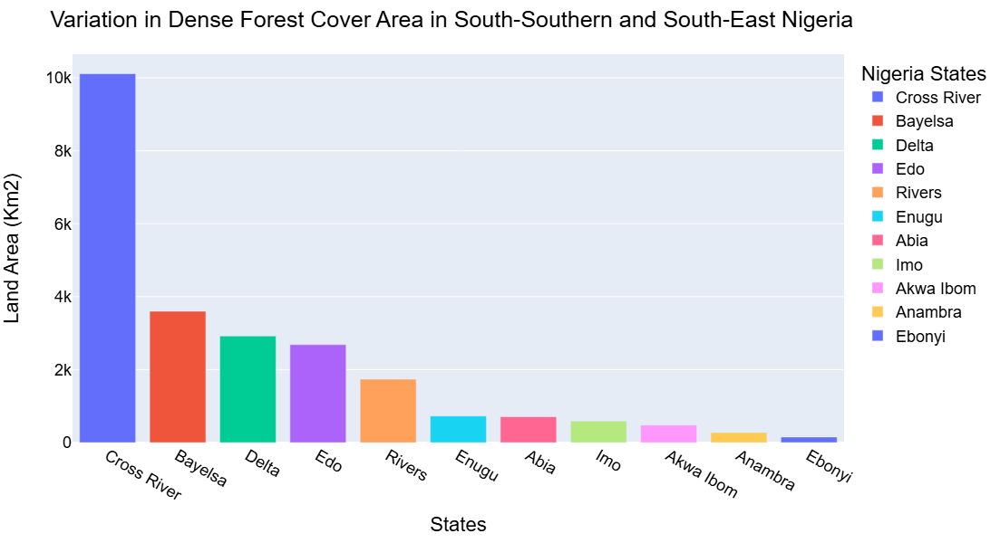

In [130]:
fig = px.bar(ss_se_fnf, x='ADM1_NAME', y='Dense Forest', color='ADM1_NAME', height=600)

fig.update_layout(
    title="Variation in Dense Forest Cover Area in South-Southern and South-East Nigeria",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

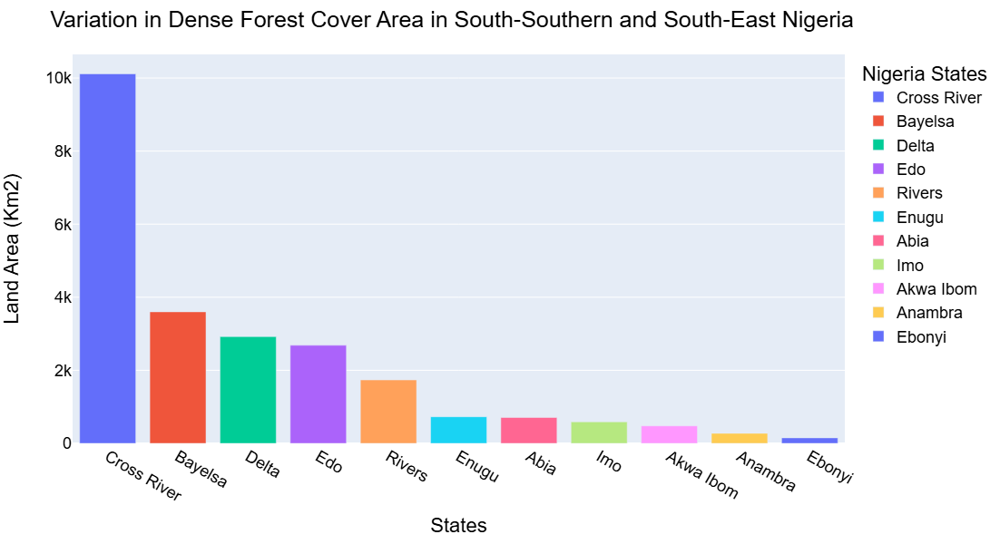

In [131]:
display(Image(filename='img/se_forestcover_bar.png', embed=True))

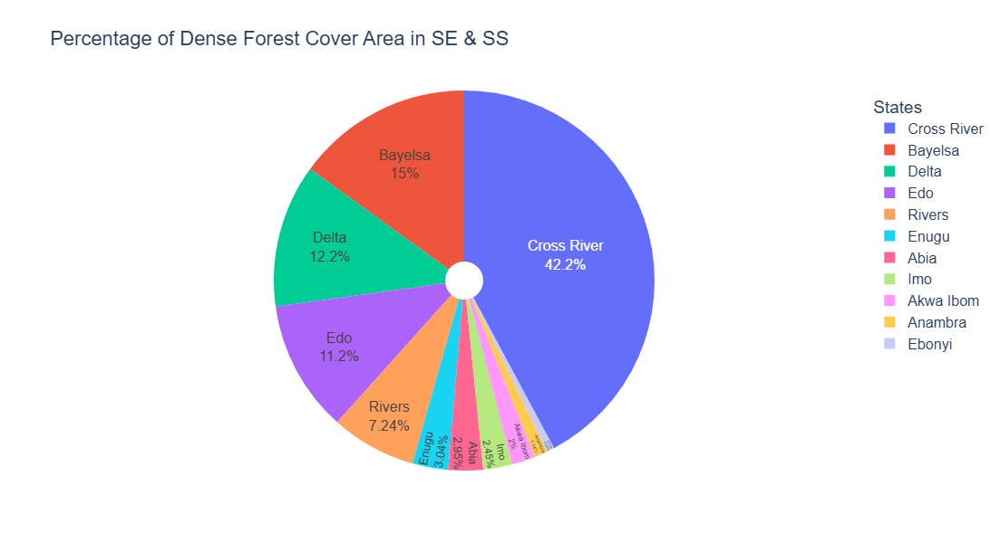

In [132]:
fig = px.pie(ss_se_fnf, values='Dense Forest', names='ADM1_NAME', hole=0.1, width=600, height=600,
             title='Percentage of Dense Forest Cover Area in SE & SS')

fig.update_traces(textposition='inside', textinfo='percent+label')

fig.update_layout(
    legend_title = 'States',
    # width=600,
    # height=600,
        font=dict(
        family="Arial",
        size=16
    )
)

fig.show()

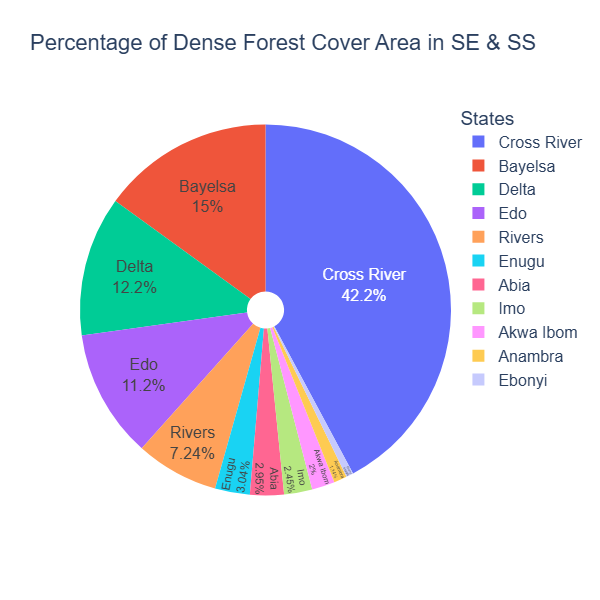

In [133]:
display(Image(filename='img/se_fnf_pie.png', embed=True))

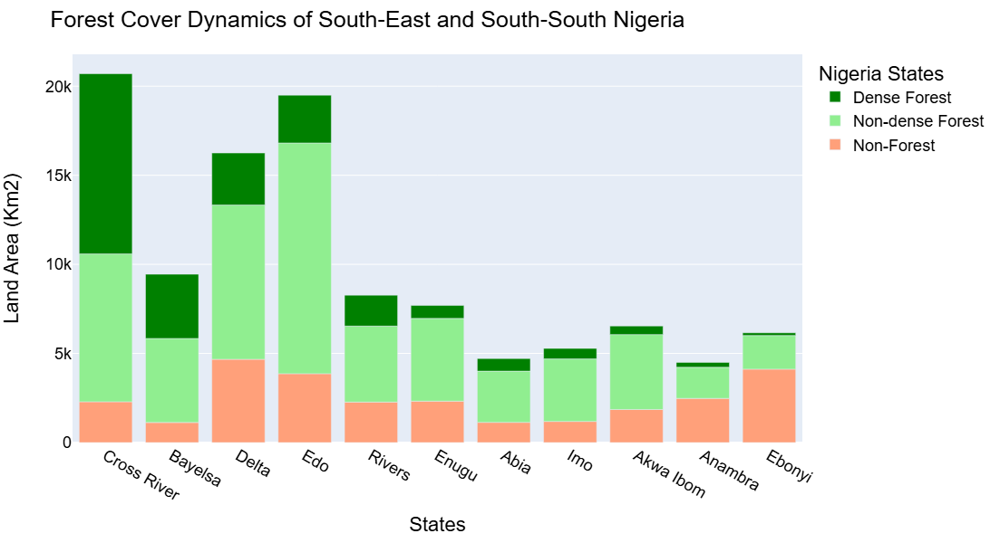

In [134]:
fig = px.bar(ss_se_fnf, x='ADM1_NAME', y=['Non-Forest','Non-dense Forest','Dense Forest'], height=600,
             color_discrete_map={'Dense Forest':'green', 'Non-dense Forest':'lightgreen', 'Non-Forest':'lightsalmon'})
             #category_orders={'Class_1', 'Class_2', 'Class_3


fig.update_layout(
    title="Forest Cover Dynamics of South-East and South-South Nigeria",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    legend_traceorder="reversed",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

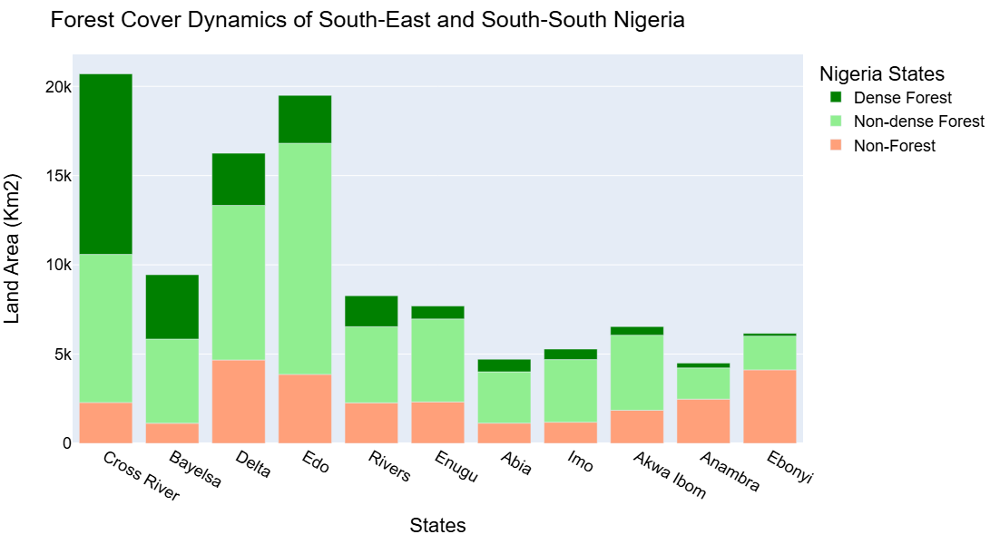

In [135]:
display(Image(filename='img/se_fnf_bar.png', embed=True))

## Evaluating Variation in Dense Forest Cover Region in North Eastern Nigeria

In [136]:
m = geemap.Map()
ne_states = nija.filter(
    ee.Filter.inList('ADM1_NAME', ['Adamawa', 'Bauchi', 'Borno', 'Gombe', 'Taraba', 'Yobe'])
)
gombe = ne_states.filter(ee.Filter.eq('ADM1_NAME', 'Gombe'))
m.centerObject(gombe, zoom=7)
m.addLayer(ne_states, {}, 'North Eastern States Boundary')
m

Map(center=[10.404839156412304, 11.244955239828244], controls=(WidgetControl(options=['position', 'transparent…

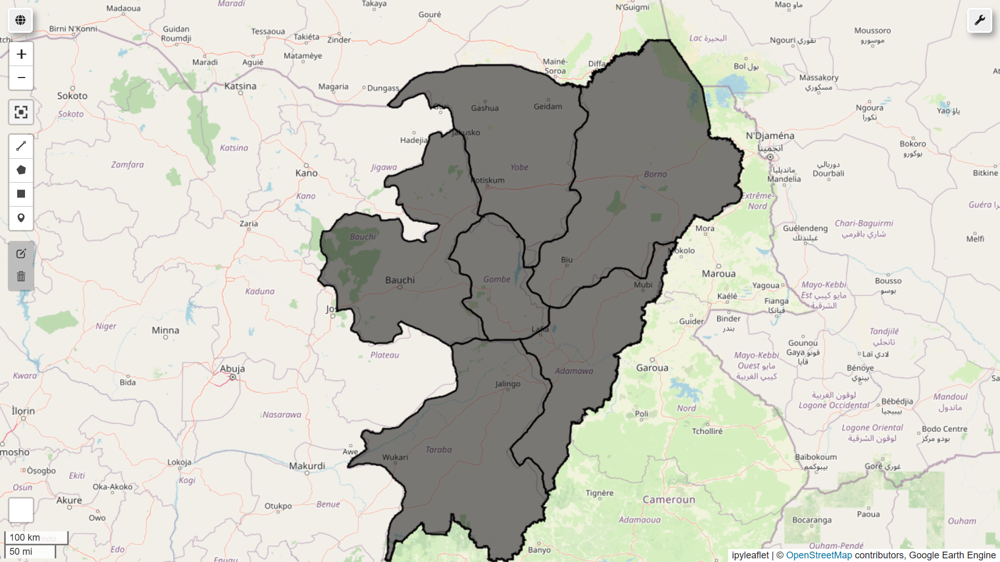

In [137]:
display(Image(filename='img/ne_states.png', embed=True))

In [138]:
m = geemap.Map()

legend_dict = {
    '1 Dense Forest': '#00b200',
    '2 Non-dense Forest': '#83ef62',
    '3 Non-Forest': '#ffff99',
    '4 Water': '#0000ff',
}

fnfVis = {
  'min': 1,
  'max': 4,
  'palette': ['00b200','83ef62','ffff99','0000ff'],
}

vis_params = {
    'color': '#000000',
    'width': 2,
    'lineType': 'solid',
    'fillColor': '00000000',
}


fnf = dataset.map(lambda img: img.clipToCollection(ne_states))
m.centerObject(gombe, zoom=7)
m.addLayer(nija.style(fillColor='00000000', width=0.5), {}, 'Nigeria')
m.addLayer(fnf, fnfVis, 'NE Forest/Non-Forest')
m.addLayer(ne_states.style(**vis_params), {}, 'NE States')
text = 'Map Created by Emeka Orji'
m.add_text(text)
text2 = 'Data Source: JAXA EORC and FAO UN'
m.add_text(text2, position='bottomleft', fontsize=10)
m.add_legend(title='Forest/Non-Forest Classification', legend_dict=legend_dict, layer_name='NE Forest/Non-Forest')
m

Map(center=[10.404839156412304, 11.244955239828244], controls=(WidgetControl(options=['position', 'transparent…

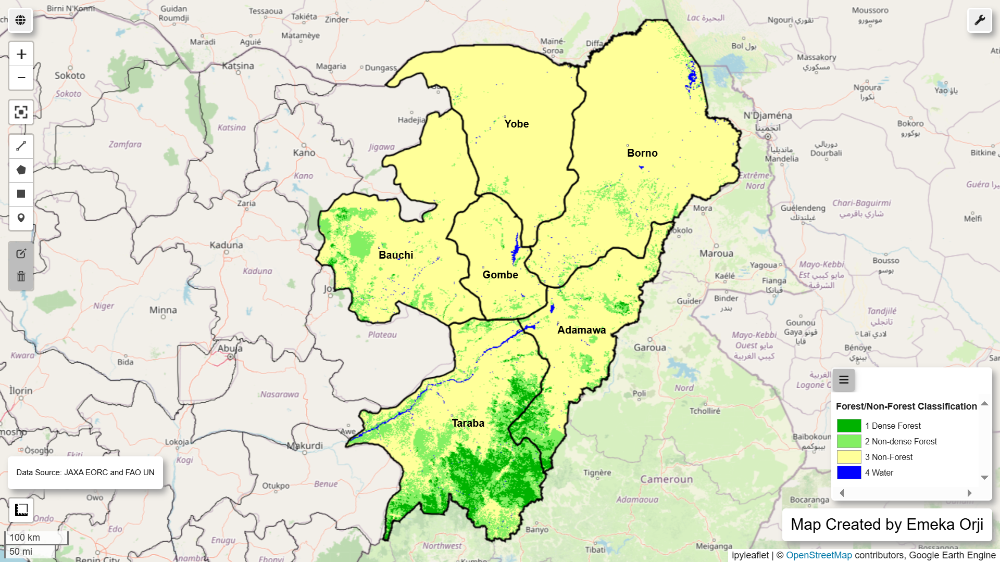

In [139]:
display(Image(filename='img/ne_forest.png', embed=True))

In [140]:
m.add_labels(
    data=ne_states,
    column="ADM1_NAME",
    font_size="10pt",
    font_color="black",
    font_family="arial",
    font_weight="bold",
    draggable=True,
)

In [141]:
nefnf = fnf.first()
project = nefnf.projection()
project

In [142]:
crs = projection['crs']
crs

'EPSG:4326'

In [143]:
fc = geemap.zonal_stats_by_group(fnf, ne_states, out_file=None, stat_type='SUM', decimal_places=2, denominator=1e6, scale=25, crs=crs, return_fc=True)

Computing ... 


In [144]:
ne_fnf = geemap.ee_to_df(fc)
ne_fnf = ne_fnf.sort_values('Class_1', ascending=False)

In [145]:
print(ne_fnf.shape)
ne_fnf.head(10)

(6, 15)


,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,Class_1,Class_2,Class_3,Class_4,Class_sum,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng
4,182,Nigeria,2239,Taraba,10384.79,19630.49,29547.09,868.19,60430.56,NO,3000,Member State,1000,4.957189,13.739033
2,182,Nigeria,2211,Adamawa,2031.85,6104.03,25871.15,384.83,34391.86,NO,3000,Member State,1000,2.830909,11.814723
0,182,Nigeria,65699,Bauchi,516.14,6131.88,42065.64,346.72,49060.38,NO,3000,Member State,1997,4.055679,12.903322
1,182,Nigeria,65704,Gombe,82.05,937.97,16840.61,329.79,18190.42,NO,3000,Member State,1997,1.501908,5.521496
3,182,Nigeria,2216,Borno,44.09,4030.74,66736.85,784.58,71596.26,NO,3000,Member State,1000,5.941520,13.717056
5,182,Nigeria,2240,Yobe,5.48,612.71,44832.83,121.77,45572.79,NO,3000,Member State,1000,3.787278,10.339501


In [146]:
ne_fnf = ne_fnf.rename(columns={'Class_1':'Dense Forest', 'Class_2':'Non-dense Forest', 'Class_3':'Non-Forest', 'Class_4':'Water Body'})

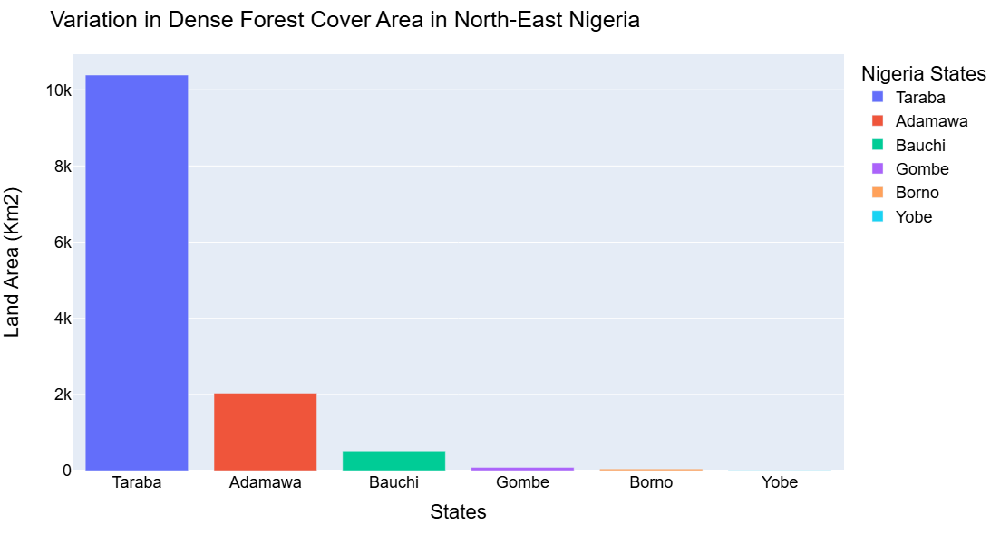

In [147]:
fig = px.bar(ne_fnf, x='ADM1_NAME', y='Dense Forest', color='ADM1_NAME', height=600)

fig.update_layout(
    title="Variation in Dense Forest Cover Area in North-East Nigeria",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

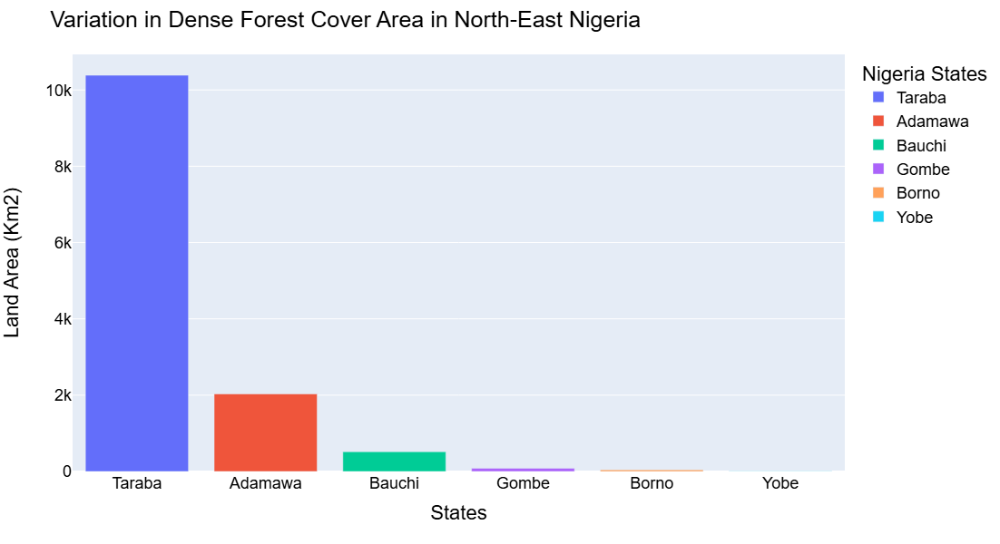

In [148]:
display(Image(filename='img/nefnf_bar.png', embed=True))

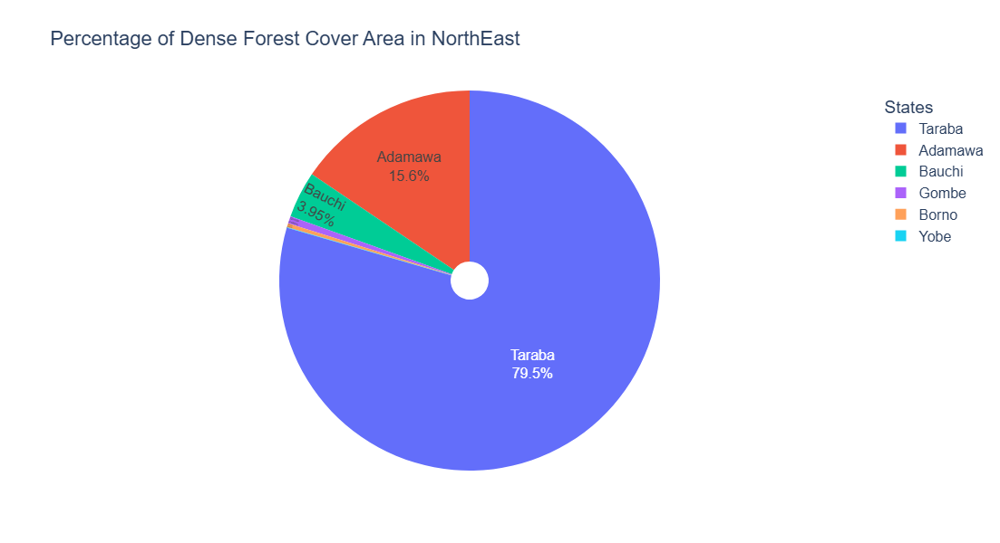

In [149]:
fig = px.pie(ne_fnf, values='Dense Forest', names='ADM1_NAME', hole=0.1, width=600, height=600,
             title='Percentage of Dense Forest Cover Area in NorthEast')

fig.update_traces(textposition='inside', textinfo='percent+label')

fig.update_layout(
    legend_title = 'States',
    # width=600,
    # height=600,
        font=dict(
        family="Arial",
        size=16
    )
)

fig.show()

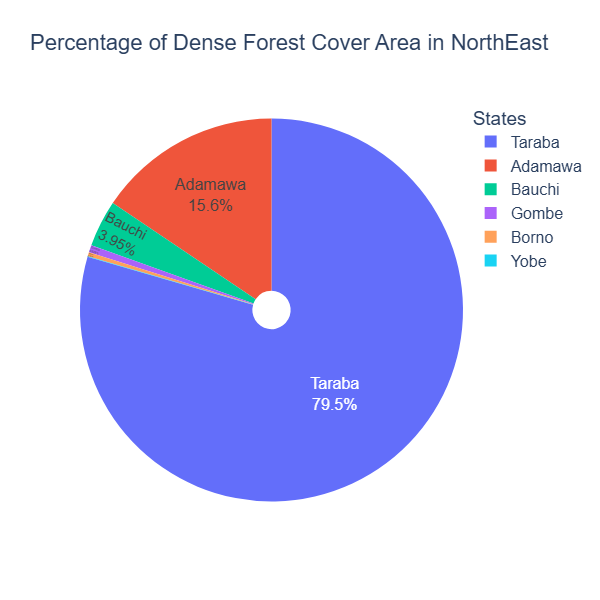

In [150]:
display(Image(filename='img/neforest_pie.png', embed=True))

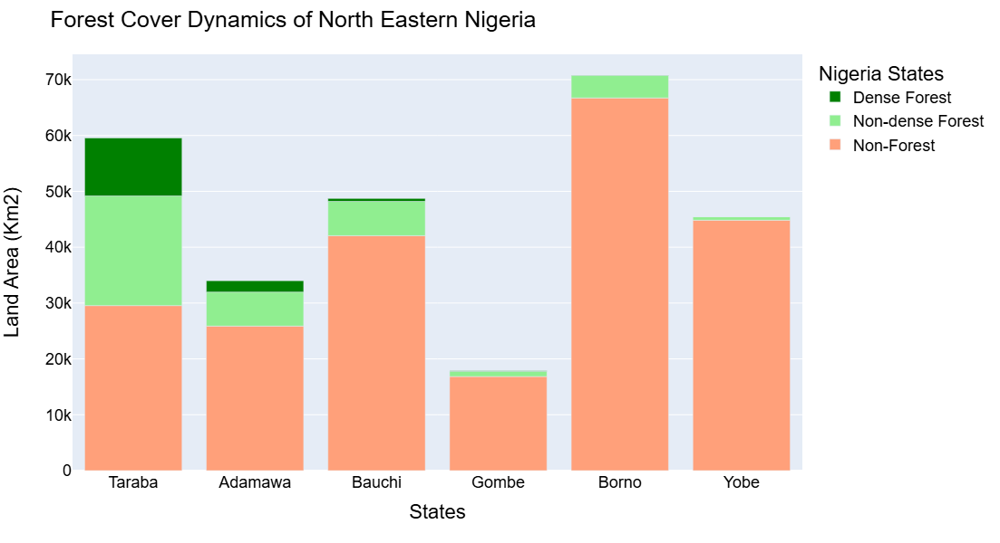

In [151]:
fig = px.bar(ne_fnf, x='ADM1_NAME', y=['Non-Forest','Non-dense Forest','Dense Forest'], height=600,
             color_discrete_map={'Dense Forest':'green', 'Non-dense Forest':'lightgreen', 'Non-Forest':'lightsalmon'})


fig.update_layout(
    title="Forest Cover Dynamics of North Eastern Nigeria",
    xaxis_title="States",
    yaxis_title="Land Area (Km2)",
    legend_title="Nigeria States",
    legend_traceorder="reversed",
    font=dict(
        family="Arial",
        size=18,
        color="Black"
    )
)

fig.show()

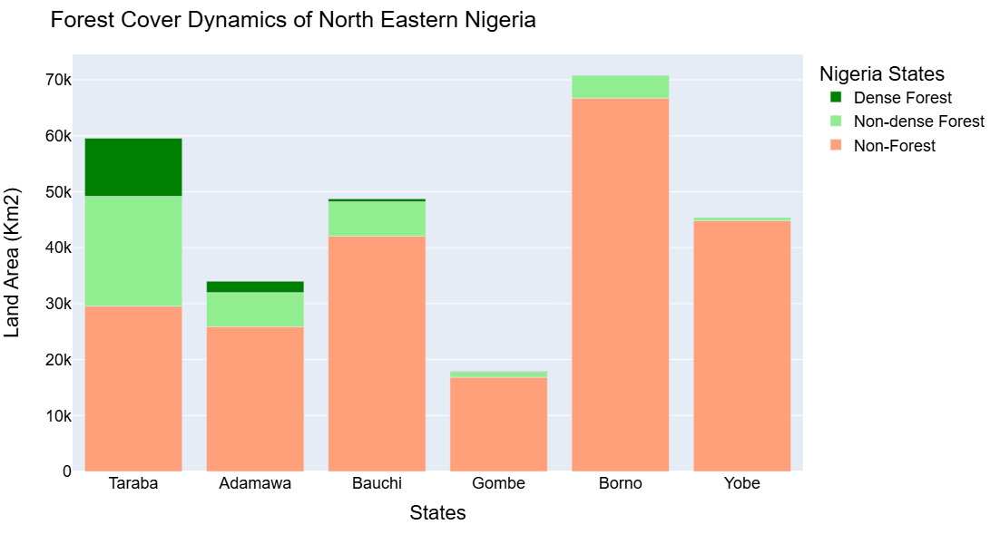

In [153]:
display(Image(filename='img/neforest_bar.png', embed=True))